# Importar librerías

In [2]:
from fastai.vision.all import *
from pathlib import Path
from PIL import Image
import os
import cv2
import time

# Prueba vídeo

In [3]:
PATH = Path('/home/javier/Escritorio/archive/mask_detector')

In [4]:
learn = load_learner(PATH/'mask_detector.pkl')

In [78]:
cap = cv2.VideoCapture(0)

face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

while(True):
    
    _,frame = cap.read()
    
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    color_im = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    
    #start_time = time.time()
    faces = face_cascade.detectMultiScale(gray, 1.1, 10) # 25ms
    #print("--- %s seconds ---" % (time.time() - start_time))
    
    n_faces = len(faces)
    n_with_mask = 0
    n_with_mask_incorrect = 0
    n_without_mask = 0
    
    frame = cv2.putText(frame, "Face detected: "+str(n_faces), (10,15), cv2.FONT_HERSHEY_SIMPLEX ,  
                   0.4, (255, 255, 255), 1, cv2.LINE_AA)

    for (x, y, w, h) in faces:
        
        #start_time = time.time()
        frame_crop = color_im[y:y+h,x:x+w]
        #cv2.imshow('mask detector',frame_crop)
        prediction = learn.predict(frame_crop) # 20ms
        #print("--- %s seconds ---" % (time.time() - start_time))
        
        color = (0,0,0)
        if(prediction[0] == "with_mask"):
            n_with_mask = n_with_mask + 1
            color = (0, 255, 0)
            aux = "with mask"
        elif(prediction[0] == "mask_weared_incorrect"):
            n_with_mask_incorrect = n_with_mask_incorrect + 1
            color = (0, 165, 255)
            aux = "mask worn incorrect"
        else:
            n_without_mask = n_without_mask + 1
            color = (0, 0, 255)
            aux = "without mask"
        
        probability = round((float(prediction[2][int(prediction[1])])/(float(prediction[2][0])+float(prediction[2][1])+float(prediction[2][2])))*100,2)
        
        cv2.rectangle(frame, (x, y), (x+w, y+h), color, 2)
        frame = cv2.putText(frame, str(aux)+"   "+str(probability)+"%", (x, y-10), cv2.FONT_HERSHEY_SIMPLEX ,  
                   0.3, color, 1, cv2.LINE_AA) 
        
    if(n_faces == 0): #Se evita la división entre 0
        n_faces = 1
        
    frame = cv2.putText(frame, "Percentage with mask: "+str(round(n_with_mask/n_faces*100, 2))+"%", (10,30), cv2.FONT_HERSHEY_SIMPLEX ,  
                0.4, (0, 255, 0), 1, cv2.LINE_AA)
    frame = cv2.putText(frame, "Percentage with mask worn incorrect: "+str(round(n_with_mask_incorrect/n_faces*100, 2))+"%", (10,45), cv2.FONT_HERSHEY_SIMPLEX ,  
                0.4, (0, 165, 255), 1, cv2.LINE_AA)
    frame = cv2.putText(frame, "Percentage without mask: "+str(round(n_without_mask/n_faces*100, 2))+"%", (10,60), cv2.FONT_HERSHEY_SIMPLEX ,  
                0.4, (0, 0, 255), 1, cv2.LINE_AA)
    
    cv2.imshow('mask detector',frame)
    
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break
        
cv2.destroyAllWindows()
cap.release()

In [62]:
cv2.destroyAllWindows()
cap.release()

# Prueba imágen

In [97]:
start_time = time.time()
im = Image.open('/home/javier/Escritorio/image.jpeg')
np_im = np.asarray(im)
gray = cv2.cvtColor(np_im, cv2.COLOR_RGB2GRAY)

faces = face_cascade.detectMultiScale(gray, 1.1, 10)

n_faces = 0
n_with_mask = 0
n_with_mask_incorrect = 0
n_without_mask = 0

for (x, y, w, h) in faces:
    n_faces = n_faces+1
        
    im_crop = np_im[y:y+h,x:x+w]
    prediction = learn.predict(im_crop)
        
    color = (0,0,0)
    if(prediction[0] == "with_mask"):
        n_with_mask = n_with_mask + 1
        color = (0, 255, 0)
        aux = "with mask"
    elif(prediction[0] == "mask_weared_incorrect"):
        n_with_mask_incorrect = n_with_mask_incorrect + 1
        color = (255, 165, 0)
        aux = "mask worn incorrect"
    else:
        n_without_mask = n_without_mask + 1
        color = (255, 0, 0)
        aux = "without mask"
        
    probability = round((float(prediction[2][int(prediction[1])])/(float(prediction[2][0])+float(prediction[2][1])+float(prediction[2][2])))*100,2)
        
    cv2.rectangle(np_im, (x, y), (x+w, y+h), color, 2)
    np_im = cv2.putText(np_im, str(aux)+"   "+str(probability)+"%", (x, y-10), cv2.FONT_HERSHEY_SIMPLEX ,  
                0.3, color, 1, cv2.LINE_AA) 
        
if(n_faces == 0):
    n_faces = 1
        
np_im = cv2.putText(np_im, "Percentage with mask: "+str(round(n_with_mask/n_faces*100, 2))+"%", (10,30), cv2.FONT_HERSHEY_SIMPLEX ,  
            0.4, (0, 255, 0), 1, cv2.LINE_AA)
np_im = cv2.putText(np_im, "Percentage with mask worn incorrect: "+str(round(n_with_mask_incorrect/n_faces*100, 2))+"%", (10,45), cv2.FONT_HERSHEY_SIMPLEX ,  
            0.4, (255, 165, 0), 1, cv2.LINE_AA)
np_im = cv2.putText(np_im, "Percentage without mask: "+str(round(n_without_mask/n_faces*100, 2))+"%", (10,60), cv2.FONT_HERSHEY_SIMPLEX ,  
            0.4, (255, 0, 0), 1, cv2.LINE_AA)
    
Image.fromarray(np_im).save('/home/javier/Escritorio/mask_detected.jpg')
print("--- %s seconds to process the image ---" % (time.time() - start_time))

--- 5.372453212738037 seconds to process the image ---


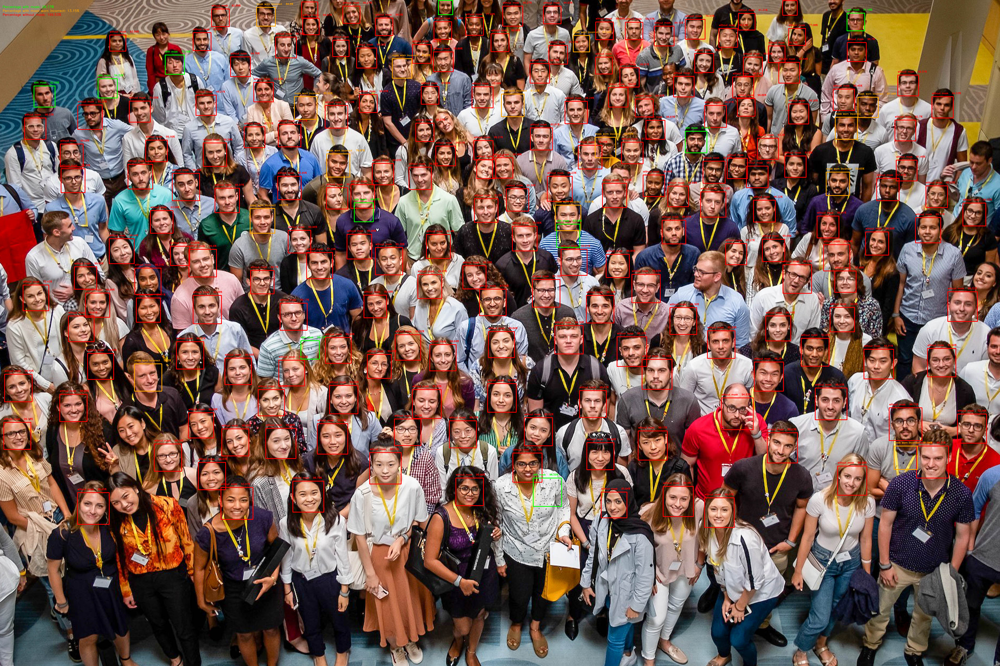

In [94]:
Image.fromarray(np_im)